In [3]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import numpy as np
import os
import cv2
from torchvision.ops import nms
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import torchvision

CONFIG_DIR = "darknet/cfg/yolov3.cfg"
WEIGHT_DIR = "../YOLO_V3/files/yolov3.weights"
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")



def load_class_names(namesfile):
    """Load COCO Class Names"""
    class_names = []
    with open(namesfile, 'r') as fp:   lines = fp.readlines()
    for line in lines:  
        line = line.rstrip()
        class_names.append(line)
        
    return class_names


plt.rcParams['figure.figsize'] = [24.0, 14.0]

# COCO Names
names = load_class_names("darknet/data/coco.names")

In [4]:
def viz_res(img, boxes, class_names, plot_labels=True):
    """
    Helper functions to visualize predictions
    """
    colors = torch.FloatTensor([[1,0,1],[0,0,1],[0,1,1],[0,1,0],[1,1,0],[1,0,0]])
    
    def get_color(c,x,max_val):
        """Get a random color from the bbox"""
        ratio = float(x) / max_val * 5
        i = int(np.floor(ratio))
        j = int(np.ceil(ratio))
        ratio = ratio - i
        r = (1-ratio) * colors[i][c] + ratio * colors[j][c]
        return int(r * 255)
    
    
    w = img.shape[1]
    h = img.shape[0]
    
    fig, a = plt.subplots(1,1)
    a.imshow(img)
    
    for i in range(len(boxes)):
        box = boxes[i]
        
        x1 = int(np.around(box[0] * w))
        y1 = int(np.around(box[1] * h))
        x2 = int(np.around(box[2] * w))
        y2 = int(np.around(box[3] * h))
        
        # Set the default rgb value to red
        rgb = (1, 0, 0)
        
        # Use the same color to plot the bounding boxes of the same object class
        if class_names:
            cls_conf = box[4]
            cls_id = box[5].int()
            classes = len(class_names)
            offset = cls_id * 1234567 % classes
            
            # Generate colors
            red   = get_color(2, offset, classes) / 255
            green = get_color(1, offset, classes) / 255
            blue  = get_color(0, offset, classes) / 255
            rgb = (red, green, blue)
        
        # Calculate the width and height of the bounding box relative to the size of the image.
        width_x = x2 - x1
        width_y = y1 - y2
        
        # Set the postion and size of the bounding box. (x1, y2) is the pixel coordinate of the
        # lower-left corner of the bounding box relative to the size of the image.
        rect = patches.Rectangle((x1, y2), width_x,
                                 width_y, 
                                 linewidth = 2,
                                 edgecolor = rgb, 
                                 facecolor = 'none')
        # Draw the bounding box on top of the image
        a.add_patch(rect)
        
        if plot_labels:
            # Create a string with the object class name and the corresponding object class probability
            conf_tx = class_names[cls_id] + ': {:.1f}'.format(cls_conf)
            
            # Define x and y offsets for the labels
            lxc = (img.shape[1] * 0.266) / 100
            lyc = (img.shape[0] * 1.180) / 100
            
            # Draw the labels on top of the image
            a.text(x1 + lxc, y1 - lyc, conf_tx, fontsize=12, color='k',
                   bbox = dict(facecolor = rgb, edgecolor=rgb, alpha=0.8))
    plt.show()

In [5]:
#export
def parse_model_config(path):
    """Parses the yolo-v3 layer configuration file and returns module definitions"""
    file = open(path, 'r')
    lines = file.read().split('\n')
    lines = [x for x in lines if x and not x.startswith('#')]
    lines = [x.rstrip().lstrip() for x in lines] # get rid of fringe whitespaces
    module_defs = []
    
    for line in lines:
        if line.startswith('['): 
            module_defs.append({})
            module_defs[-1]['type'] = line[1:-1].rstrip()
            if module_defs[-1]['type'] == 'convolutional':
                module_defs[-1]['batch_normalize'] = 0
        else:
            key, val = line.split("=")
            key = key.rstrip()
            if key == "anchors":
                # convert anchors to numpy array
                module_defs[-1][key] = np.array([float(x) for x in val.split(',')]).reshape((-1, 2))
            elif key == "mask":
                # convert masks to list
                module_defs[-1][key] = [int(x) for x in val.split(',')]
            else:
                val = val.strip()
                module_defs[-1][key] = val.strip()

    return module_defs

In [6]:
# export
class EmptyLayer(nn.Module):
    def __init__(self):
        super(EmptyLayer,self).__init__()
    def forward(self,xb):
        return xb
    
    
class YoloLayer(nn.Module):
    def __init__(self,anchors,num_classes,img_dim):
        super(YoloLayer, self).__init__()
        self.anchors = anchors
        self.num_anchors = len(anchors)
        self.img_dim = img_dim
        self.grid_size = 0
        self.num_classes = num_classes
        
    def _compute_grid_offsets(self,grid_size,cuda=True):
        FloatTensor = torch.cuda.FloatTensor if cuda else torch.FloatTensor
        
        self.grid_size = grid_size
        g = self.grid_size
        
        # Ratio of the size of the img_dim to the size of the feature map
        ## we need this to rescale the anchors
        self.stride = self.img_dim / self.grid_size
        
        # calculate offsets for each grid
        grid_y, grid_x = torch.meshgrid(torch.arange(g), torch.arange(g))
        # reshape grid into [1, 1, g, g] form [g, g]
        self.grid_x = grid_x.view([1, 1, g, g]).type(FloatTensor)
        self.grid_y = grid_y.view([1, 1, g, g]).type(FloatTensor)
        
        # scale the anchors by dividing by the stride of the input_image size
        self.scaled_anchors = FloatTensor([(a_w / self.img_dim, a_h / self.img_dim) for a_w, a_h in self.anchors])
        self.anchor_w = self.scaled_anchors[:, 0:1].view((1, self.num_anchors, 1, 1))
        self.anchor_h = self.scaled_anchors[:, 1:2].view((1, self.num_anchors, 1, 1))
        
    def forward(self,xb,img_dim=None):
        FloatTensor = torch.cuda.FloatTensor if xb.is_cuda else torch.FloatTensor
        
        self.img_dim = img_dim
        batch_size = xb.size(0)
        grid_size = xb.size(2)
        
        # Process the predictions to managable form
        ## shape xb: [batch_size, (num_anchors+(5+num_classes)), grid_size, grid_size]
        ## reshape into: [batch_size, num_anchors, (5+num_classes), grid_size, grid_size]
        prediction = xb.view(batch_size, self.num_anchors, self.num_classes+5,grid_size,grid_size)
        ## reshape into: [batch_size, num_anchors, grid_size, grid_size, (5+num_classes)]
        prediction = prediction.permute(0, 1, 3, 4, 2)
        
        # Sigmoid the outputs [xcenter,ycenter,confidence,class_preds] & 
        # extract the height and width of the predictions
        x = torch.sigmoid(prediction[..., 0])  # Center x
        y = torch.sigmoid(prediction[..., 1])  # Center y
        w = prediction[..., 2]  # Width
        h = prediction[..., 3]  # Height
        confidence = torch.sigmoid(prediction[...,4])
        class_preds = torch.sigmoid(prediction[...,5:])
        
        self._compute_grid_offsets(grid_size, cuda=xb.is_cuda)
        
        # add offsets & scale with anchors
        ## scale box co-ordinates realative to the input image size
        bboxes = FloatTensor(prediction[..., :4].shape)
        bboxes[..., 0] = (x.data + self.grid_x) / self.grid_size
        bboxes[..., 1] = (y.data + self.grid_y) / self.grid_size
        bboxes[..., 2] = torch.exp(w.data) * self.anchor_w
        bboxes[..., 3] = torch.exp(h.data) * self.anchor_h
        
        # These bbox will have the absolute normalized values of xcenter, ycenter, w, h 
        # bboxes shape: [batch_size, num_anchors, grid_size, grid_size, 4]
        # reshape into: [batch_size, (num_anchors*grid_size*grid_size), 4]
        # reshape confidence into: [batch_size, (num_anchors*grid_size*grid_size), 1]
        # reshape class_preds into: [batch_size, (num_anchors*grid_size*grid_size), num_classes]
        
        # shape: [batch_size, (num_anchors*grid_size*grid_size), (4+1+num_classes)]
        
        output = torch.cat(
            (
                bboxes.view(batch_size, -1, 4),
                confidence.view(batch_size, -1, 1),
                class_preds.view(batch_size, -1, self.num_classes),),-1)
        
        return output

In [7]:
# export
def create_modules(module_defs, img_size):
    hyperparams = module_defs.pop(0)
    output_filters = [int(hyperparams["channels"])]
    module_list = nn.ModuleList()
    for i,module_def in enumerate(module_defs):
        modules = nn.Sequential()
        if module_def["type"] == "convolutional":
            # grab the params of this layer
            bn = int(module_def["batch_normalize"])
            filters = int(module_def["filters"])
            kernel_size = int(module_def["size"])
            stride = int(module_def["stride"])
            pad = (kernel_size - 1) // 2
            layer = nn.Conv2d(output_filters[-1],filters,kernel_size,stride=stride,padding=pad,bias=not bn)
            modules.add_module(f"conv_{i}", layer)
            if bn:
                modules.add_module(f"batch_norm_{i}",nn.BatchNorm2d(filters,momentum=0.9,eps=1E-4))
            if module_def["activation"] == "leaky":
                modules.add_module(f"leaky_{i}", nn.LeakyReLU(0.1,inplace=True))
            
        elif module_def["type"] == "upsample":
            layer = nn.Upsample(scale_factor=int(module_def["stride"]), mode="nearest")
            modules.add_module(f"upsample_{i}", layer)
            
        elif module_def["type"] == "route":
            layers = [int(x) for x in module_def["layers"].split(",")]
            filters = sum([output_filters[1:][i] for i in layers])
            modules.add_module(f"route_{i}", EmptyLayer())
            
        elif module_def["type"] == "shortcut":
            filters = output_filters[1:][int(module_def["from"])]
            modules.add_module(f"shortcut_{i}", EmptyLayer())
            
        elif module_def["type"] == "yolo":
            anchor_idxs = module_def["mask"]
            anchors = [module_def["anchors"][i] for i in anchor_idxs]
            num_classes = int(module_def["classes"])
            img_size = int(hyperparams["height"])
            yolo_layer = YoloLayer(anchors,num_classes, img_size)
            modules.add_module(f"yolo_layer_{i}", yolo_layer)
            
        module_list.append(modules)
        output_filters.append(filters)
        
    return hyperparams, module_list

In [10]:
# export
class Darknet(nn.Module):
    def __init__(self, config_pth, img_size=416):
        super(Darknet, self).__init__()
        self.module_defs = parse_model_config(config_pth)
        self.hyperparams,self.module_list = create_modules(self.module_defs,img_size)
        self.yolo_layers = [layer[0] for layer in self.module_list if hasattr(layer[0],"anchors")]
        
    def forward(self,x):
        img_dim = x.shape[2]
        layer_outputs, yolo_outputs = [],[]
        for i, (module_def,module) in enumerate(zip(self.module_defs,self.module_list)):
            if module_def["type"] in ["convolutional", "upsample"]:
                x = module(x)
            elif module_def["type"] == "route":
                x = torch.cat([layer_outputs[int(layer_i)] for layer_i in module_def["layers"].split(",")],1)
            elif module_def["type"] == "shortcut":
                layer_i = int(module_def["from"])
                x = layer_outputs[-1] + layer_outputs[layer_i]
            elif module_def["type"] == "yolo":
                x = module[0](x,img_dim)
                yolo_outputs.append(x)
            layer_outputs.append(x)
        yolo_outputs = torch.cat(yolo_outputs, dim=1).detach().cpu()
        return yolo_outputs
    
    def load_darknet_weights(self, weights_path):
        """Parses and loads the weights stored in 'weights_path'"""
        # Open the weights file
        with open(weights_path, "rb") as f:
            header = np.fromfile(f, dtype=np.int32, count=5)  # First five are header values
            self.header_info = header  # Needed to write header when saving weights
            self.seen = header[3]  # number of images seen during training
            weights = np.fromfile(f, dtype=np.float32)  # The rest are weights

        # Establish cutoff for loading backbone weights
        cutoff = None
        if "darknet53.conv.74" in weights_path:
            cutoff = 75
        counter = 1
        ptr = 0
        for i, (module_def, module) in enumerate(zip(self.module_defs, self.module_list)):
            if i == cutoff:
                break
            if module_def["type"] == "convolutional":
                conv_layer = module[0]
                if module_def["batch_normalize"]:
                    # Load BN bias, weights, running mean and running variance
                    bn_layer = module[1]
                    num_b = bn_layer.bias.numel()  # Number of biases
                    # Bias
                    bn_b= torch.from_numpy(weights[ptr : ptr + num_b]).view_as(bn_layer.bias)
                    bn_layer.bias.data.copy_(bn_b)
                    ptr += num_b
                    # Weight
                    bn_w = torch.from_numpy(weights[ptr : ptr + num_b]).view_as(bn_layer.weight)
                    bn_layer.weight.data.copy_(bn_w)
                    ptr += num_b
                    # Running Mean
                    bn_rm = torch.from_numpy(weights[ptr : ptr + num_b]).view_as(bn_layer.running_mean)
                    bn_layer.running_mean.data.copy_(bn_rm)
                    ptr += num_b
                    # Running Var
                    bn_rv = torch.from_numpy(weights[ptr : ptr + num_b]).view_as(bn_layer.running_var)
                    bn_layer.running_var.data.copy_(bn_rv)
                    ptr += num_b
                else:
                    # Load conv. bias
                    num_b = conv_layer.bias.numel()
                    conv_b = torch.from_numpy(weights[ptr : ptr + num_b]).view_as(conv_layer.bias)
                    conv_layer.bias.data.copy_(conv_b)
                    ptr += num_b
                # Load conv. weights
                num_w = conv_layer.weight.numel()
                conv_w = torch.from_numpy(weights[ptr : ptr + num_w]).view_as(conv_layer.weight)
                conv_layer.weight.data.copy_(conv_w)
                ptr += num_w
            percent_comp = (counter / len(self.module_list)) * 100
            print("[INFO] Loading weights. {:.2f}%".format(percent_comp),end = '\r', flush = True)
            counter += 1

In [11]:
# export 
def cvt_boxes(x):
    """convert boxes from xywh to x1y1x2y2"""
    y = x.new(x.shape)
    y[..., 0] = x[..., 0] - x[..., 2] / 2
    y[..., 1] = x[..., 1] - x[..., 3] / 2
    y[..., 2] = x[..., 0] + x[..., 2] / 2
    y[..., 3] = x[..., 1] + x[..., 3] / 2
    return y

In [12]:
# export
def box_iou(box1,box2):
    """
    Return IOU of two bounding boxes
    """    
    xi1 = torch.max(box1[:,0], box2[:,0])
    yi1 = torch.max(box1[:,1], box2[:,1])
    xi2 = torch.min(box1[:,2], box2[:,2])
    yi2 = torch.min(box1[:,3], box2[:,3])
    
    # Add 1 because all our ped boxes are in normalized form
    inter_area = torch.clamp(yi2 - yi1 + 1, min=0) * torch.clamp(xi2 - xi1 + 1, min=0)
    
    # Calculate the Union area
    box1_area = (box1[:,3] - box1[:,1] + 1) * (box1[:,2] - box1[:,0] + 1)
    box2_area = (box2[:,3] - box2[:,1] + 1) * (box2[:,2] - box2[:,0] + 1)
    union_area = (box1_area + box2_area - inter_area + 1e-16)
    
    iou = inter_area / union_area
    return iou

In [13]:
def batched_nms(boxes: torch.Tensor, scores: torch.Tensor, idxs: torch.Tensor, iou_threshold: float):
    """
    [
    From :
    (https://github.com/facebookresearch/detectron2/blob/master/detectron2/modeling/roi_heads/fast_rcnn.py#L107-L115)
    ]
    Same as torchvision.ops.boxes.batched_nms, but safer.
    """
    assert boxes.shape[-1] == 4
    if len(boxes) < 40000:
        return torchvision.ops.boxes.batched_nms(boxes, scores, idxs, iou_threshold)

    result_mask = scores.new_zeros(scores.size(), dtype=torch.bool)
    for id in torch.jit.annotate(List[int], torch.unique(idxs).cpu().tolist()):
        mask = (idxs == id).nonzero().view(-1)
        keep = nms(boxes[mask], scores[mask], iou_threshold)
        result_mask[mask[keep]] = True
    keep = result_mask.nonzero().view(-1)
    keep = keep[scores[keep].argsort(descending=True)]
    return keep

In [14]:
def NonMaxSupression(predictions, score_thres=0.5, iou_thres=0.5):
    """
    Performs non-maximum suppression (NMS) on the boxes according
    to their intersection-over-union (IoU).
    """
    predictions[..., :4] = cvt_boxes(predictions[..., :4])
    output_preds = []
    
    for i, pred in enumerate(predictions):
        pred = pred[pred[:, 4] >= score_thres]
        if not pred.size(0):   continue

        boxes = pred[:,:4]
        scores = pred[:, 4] * pred[:, 5:].max(1)[0] 
        _ ,cls_labels = pred[:, 5:].max(1)

        detections = torch.cat((boxes, scores.unsqueeze(dim=1), cls_labels.unsqueeze(dim=1).float()),
                               dim=-1)
        
        scores, cls_labels = scores.view([-1]), cls_labels.type(torch.int32).view([-1])
        
        assert boxes.size(0) == scores.size(0) == cls_labels.size(0)
        
        keep = batched_nms(boxes, scores, cls_labels, iou_thres)
        output_preds.append(detections[keep])
        
    assert len(output_preds) > 0, "[INFO] No objects detected in current Image"
    
    return output_preds

In [15]:
model = Darknet(config_pth=CONFIG_DIR, img_size=416)
model.load_darknet_weights(WEIGHT_DIR)

In [16]:
def show_res(image, detections, names):
    h,w = image.shape[:2]
    for dets in detections:
        prob = dets[4]
        cls = dets[5]
        bb.add(image, dets[0]*w, dets[1]*h, dets[2]*w, dets[3]*h, label=f"{names[int(cls)]}")
    plt.axis("off")
    plt.imshow(image)

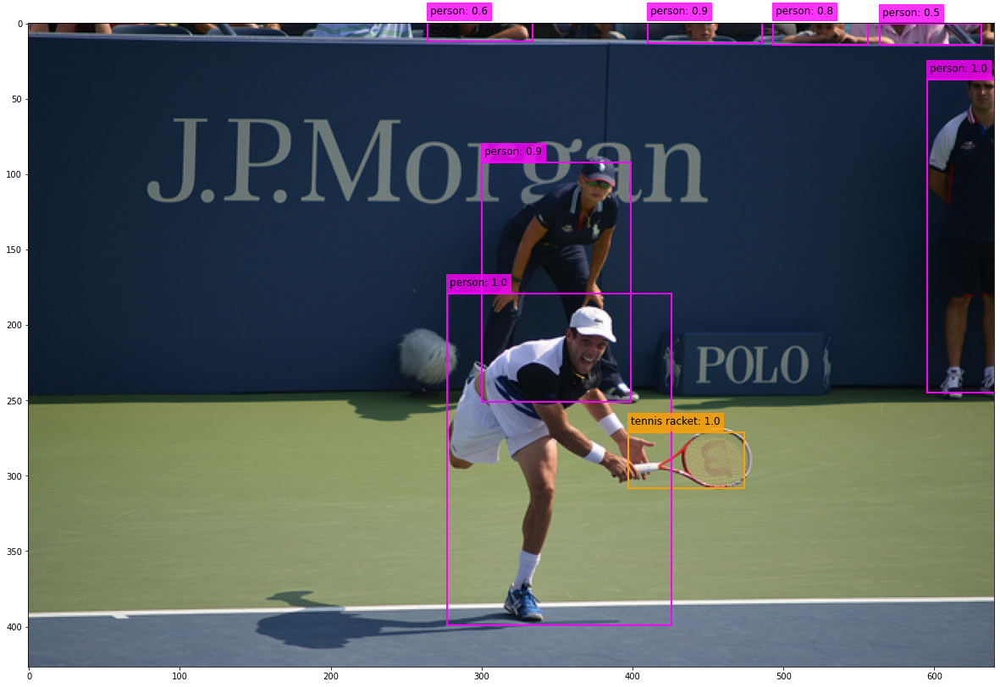

In [17]:
# Test
model.eval()
img = cv2.imread("data/val2017/000000000885.jpg")
original_image = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
resized_image = cv2.resize(original_image, (416, 416))
img = torch.from_numpy(resized_image.transpose(2,0,1)).float().div(255.0).unsqueeze(0)
detections = model(img)
dets = NonMaxSupression(detections)
viz_res(original_image, dets[0], names)

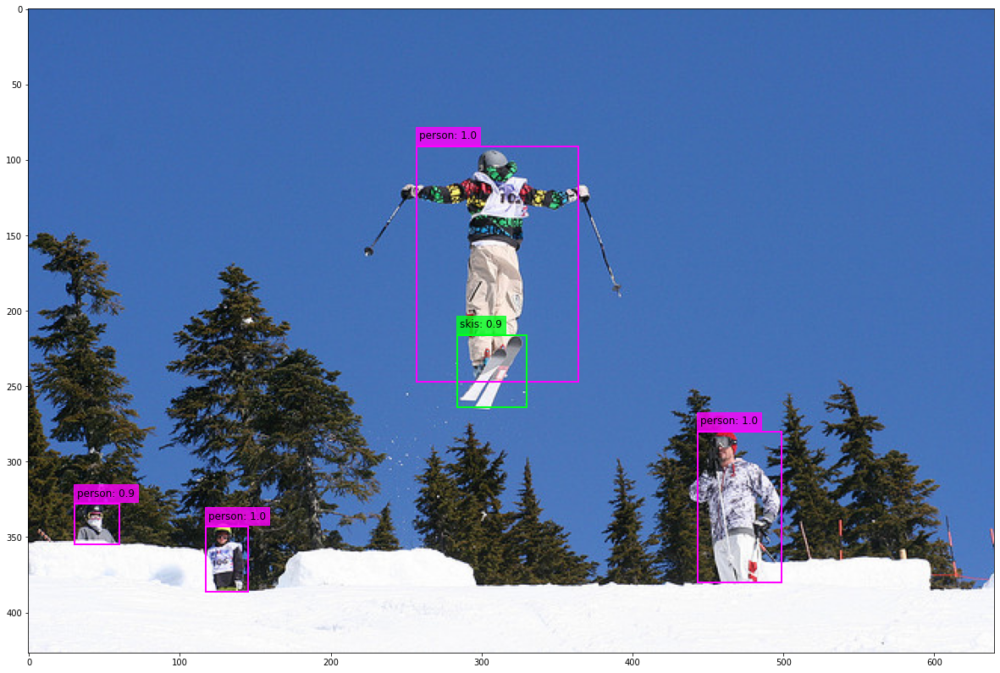

In [44]:
# Test
model.eval()
img = cv2.imread("data/val2017/000000002473.jpg")
original_image = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
resized_image = cv2.resize(original_image, (416, 416))
img = torch.from_numpy(resized_image.transpose(2,0,1)).float().div(255.0).unsqueeze(0)
detections = model(img)
dets = NonMaxSupression(detections)
viz_res(original_image, dets[0], names)

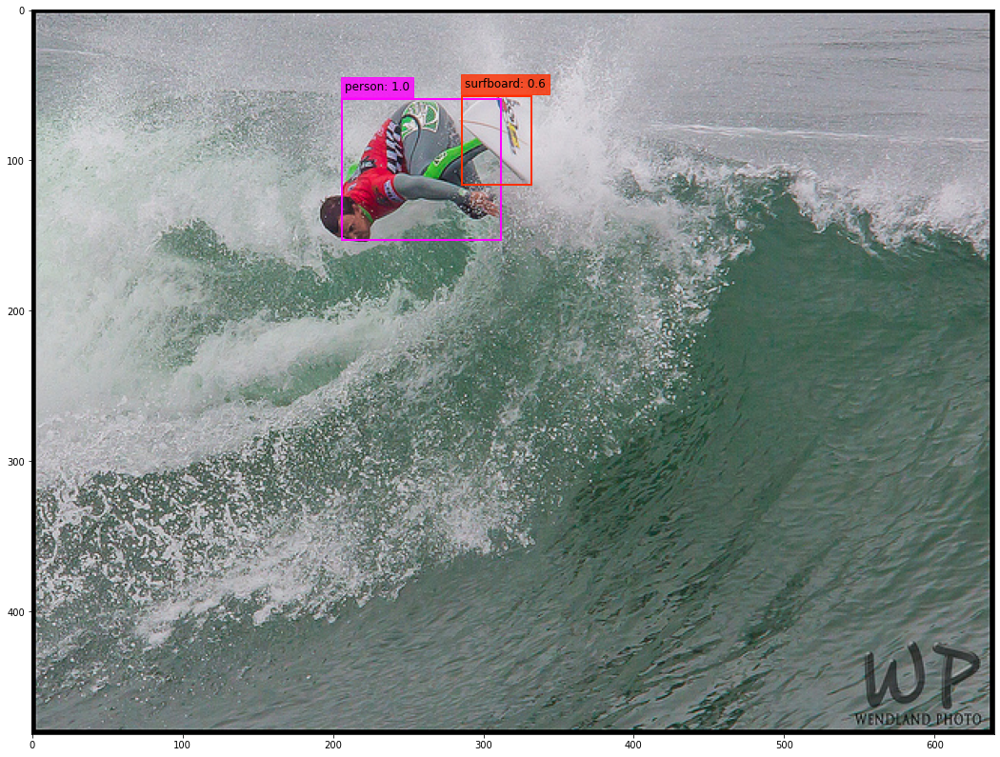

In [45]:
# Test
model.eval()
img = cv2.imread("data/val2017/000000007278.jpg")
original_image = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
resized_image = cv2.resize(original_image, (416, 416))
img = torch.from_numpy(resized_image.transpose(2,0,1)).float().div(255.0).unsqueeze(0)
detections = model(img)
dets = NonMaxSupression(detections)
viz_res(original_image, dets[0], names)

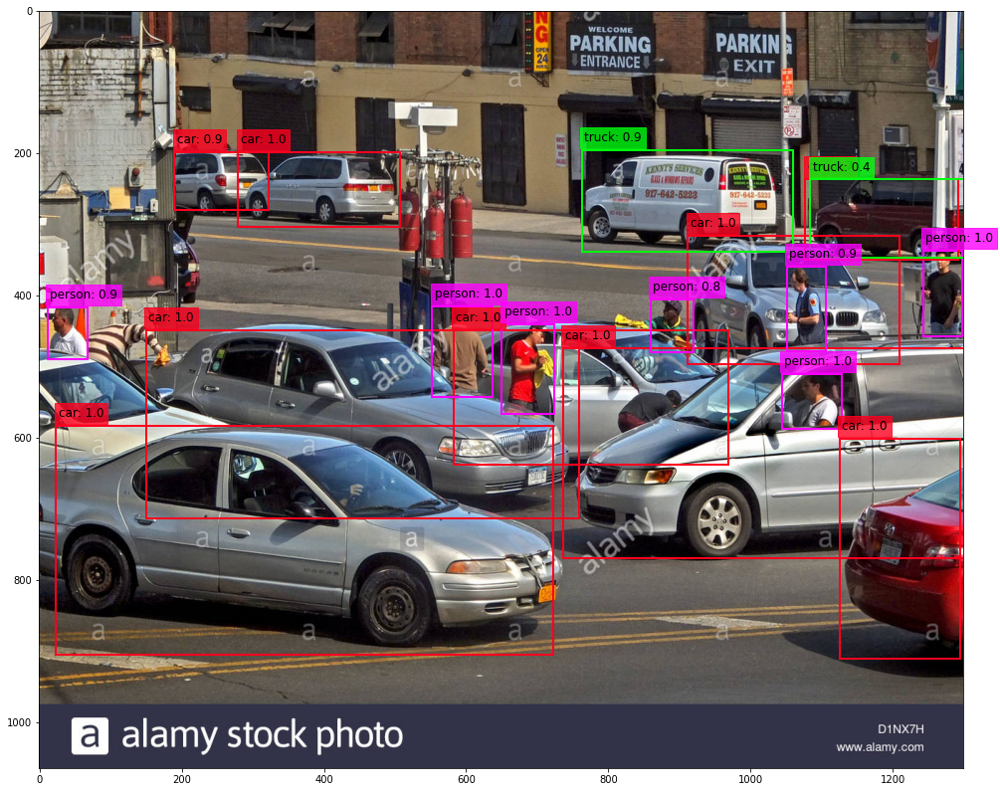

In [46]:
# Test
model.eval()
img = cv2.imread("data/car.jpg")
original_image = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
resized_image = cv2.resize(original_image, (416, 416))
img = torch.from_numpy(resized_image.transpose(2,0,1)).float().div(255.0).unsqueeze(0)
detections = model(img)
dets = NonMaxSupression(detections)
viz_res(original_image, dets[0], names)

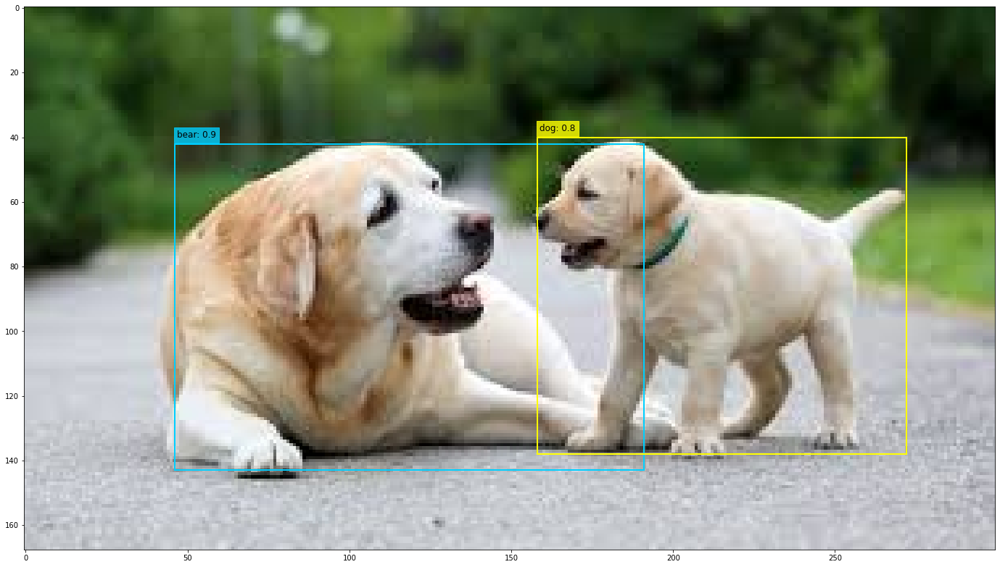

In [60]:
# Test
model.eval()
img = cv2.imread("data/dog.jpeg")
original_image = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
resized_image = cv2.resize(original_image, (416, 416))
img = torch.from_numpy(resized_image.transpose(2,0,1)).float().div(255.0).unsqueeze(0)
detections = model(img)
dets = NonMaxSupression(detections)
viz_res(original_image, dets[0], names)

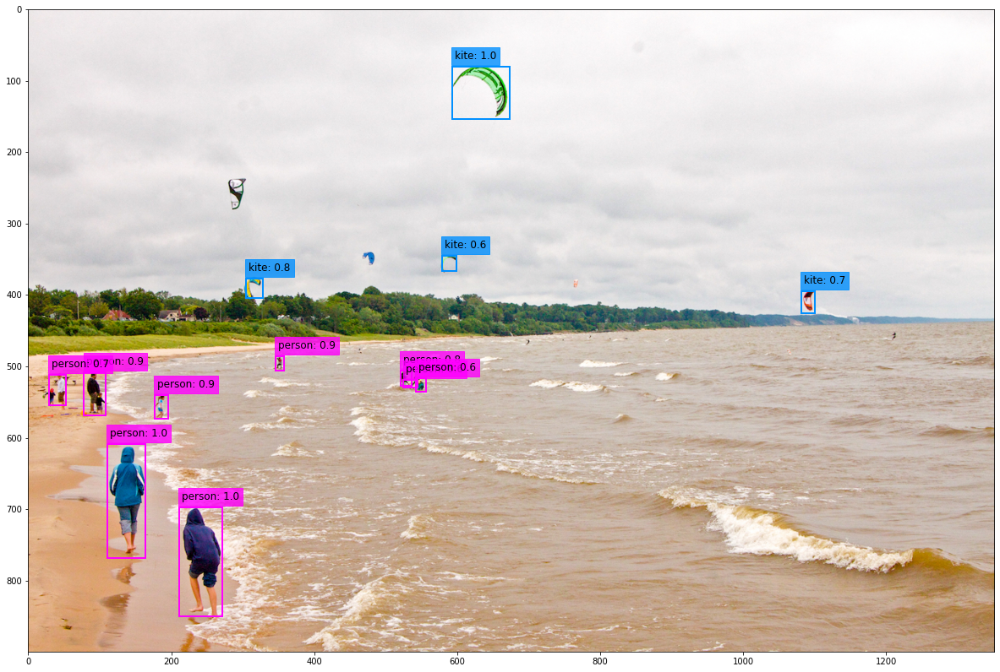

In [47]:
# Test
model.eval()
img = cv2.imread("data/image_1.jpg")
original_image = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
resized_image = cv2.resize(original_image, (416, 416))
img = torch.from_numpy(resized_image.transpose(2,0,1)).float().div(255.0).unsqueeze(0)
detections = model(img)
dets = NonMaxSupression(detections)
viz_res(original_image, dets[0], names)

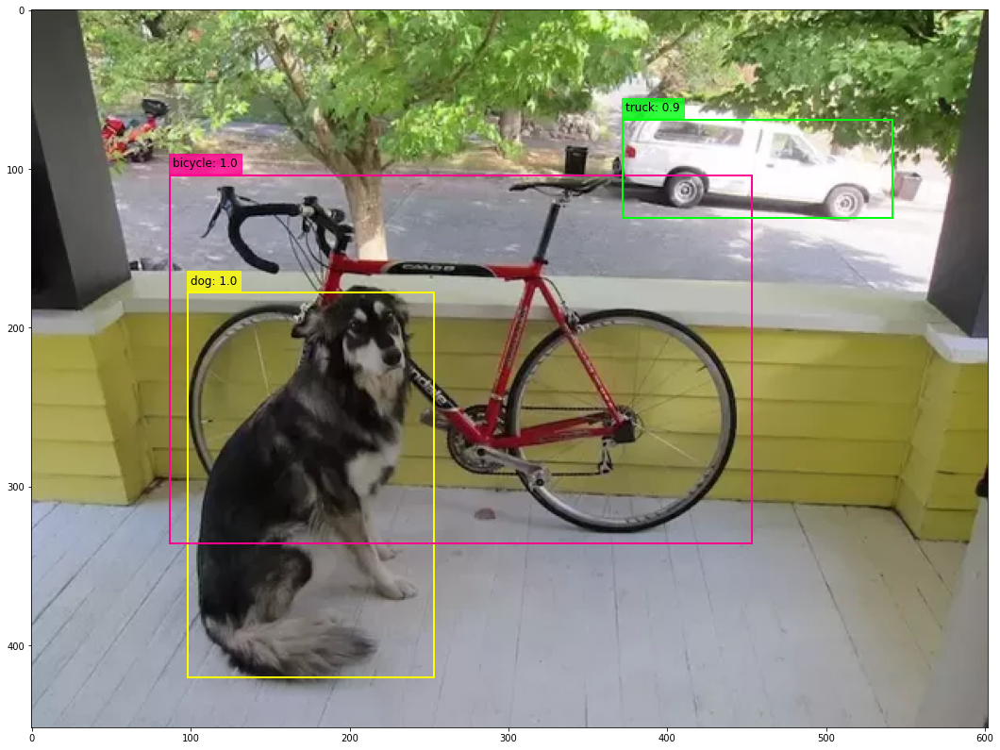

In [18]:
# Test
model.eval()
img = cv2.imread("dog-cycle-car.png")
original_image = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
resized_image = cv2.resize(original_image, (416, 416))
img = torch.from_numpy(resized_image.transpose(2,0,1)).float().div(255.0).unsqueeze(0)
detections = model(img)
dets = NonMaxSupression(detections)
viz_res(original_image, dets[0], names)

In [19]:
print(dets)

[tensor([[ 0.1632,  0.3947,  0.4201,  0.9285,  0.9996, 16.0000],
        [ 0.1438,  0.2302,  0.7526,  0.7426,  0.9937,  1.0000],
        [ 0.6178,  0.1520,  0.9009,  0.2900,  0.8832,  7.0000]])]


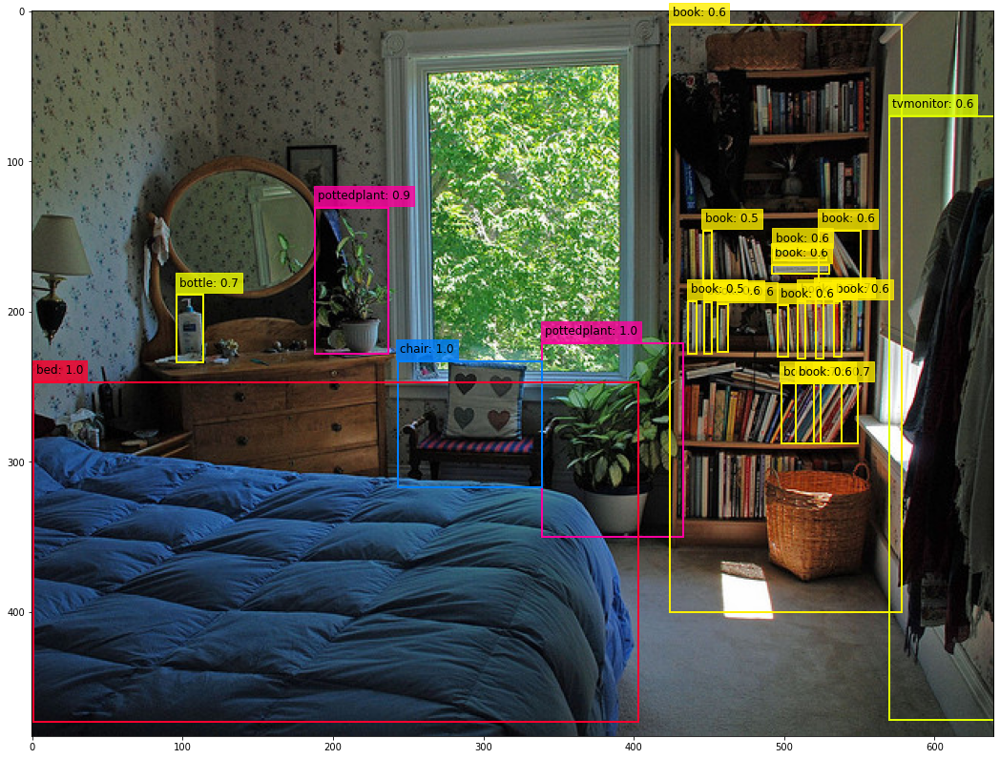

In [49]:
# Test
model.eval()
img = cv2.imread("data/val2017/000000000632.jpg")
original_image = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
resized_image = cv2.resize(original_image, (416, 416))
img = torch.from_numpy(resized_image.transpose(2,0,1)).float().div(255.0).unsqueeze(0)
detections = model(img)
dets = NonMaxSupression(detections)
viz_res(original_image, dets[0], names)